In [1]:
from MLDevHelper.DataManager import dataset_manager 

Dataset structure loaded.


In [2]:
dataset_manager.add_dataset("car-bike1" , r"C:\Users\mahes\DSA PROJ - v2\Car-Bike-Dataset" , 0.8 , 0.1 , 0.1 , ["jpg", "jpeg", "png"] , balance=True)
dataset_manager.add_dataset("car-bike2" , r"C:\Users\mahes\DSA PROJ - v2\Car-Bike-Dataset" , 0.8 , 0.1 , 0.1 , ["jpg", "jpeg", "png"] , balance=False)

Dataset 'car-bike1' already exists. Cannot add duplicate datasets.
Dataset 'car-bike2' already exists. Cannot add duplicate datasets.


In [3]:
dataset_manager.

Datasets:
car-bike1
car-bike2


In [4]:
train_df = dataset_manager.get_train_df("car-bike1")
test_df = dataset_manager.get_test_df("car-bike1")
val_df = dataset_manager.get_val_df("car-bike1")

c:\Users\mahes\DSA PROJ - v2\MLDevHelper\DataLoader.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels = [df.iloc[idx][1] for idx in batch_indices]


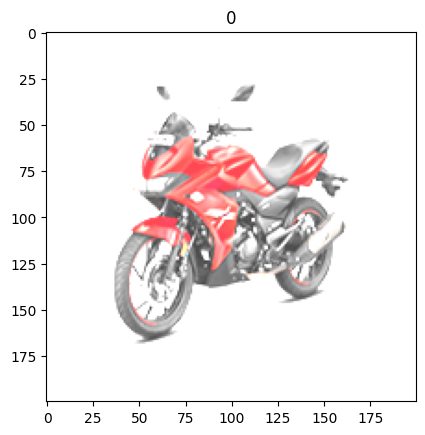

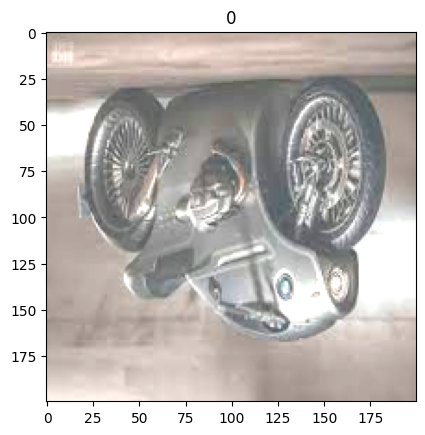

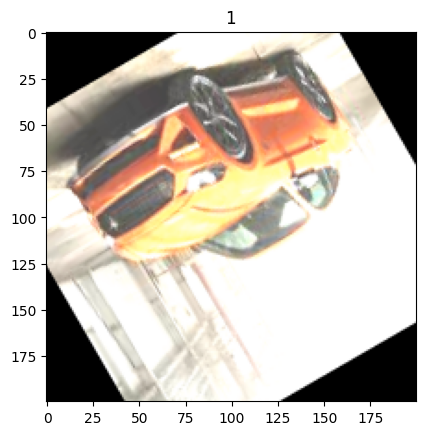

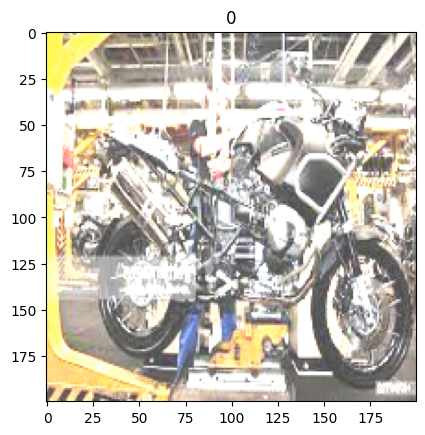

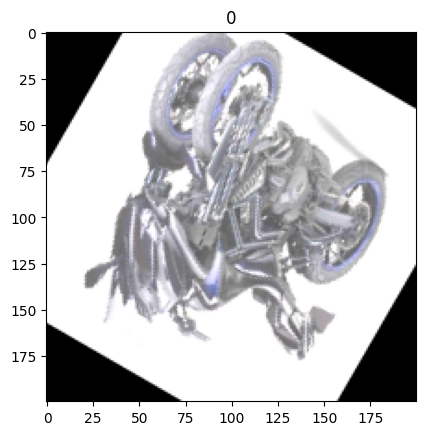

...

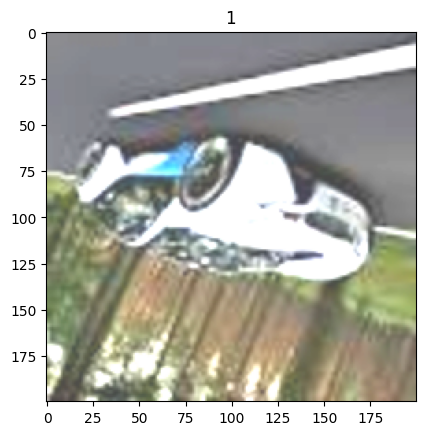

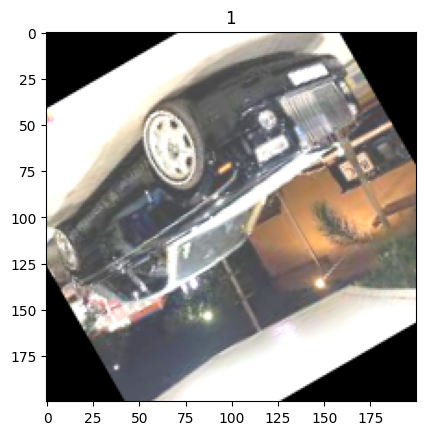

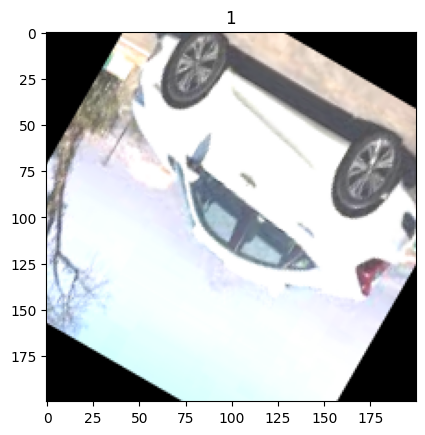

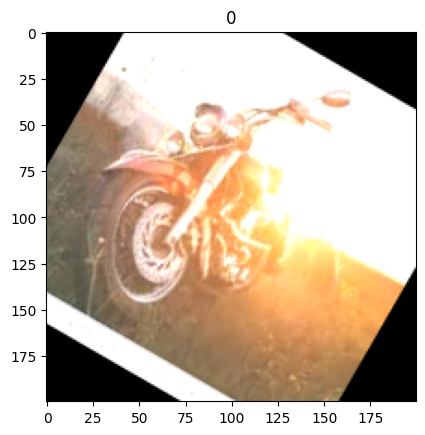

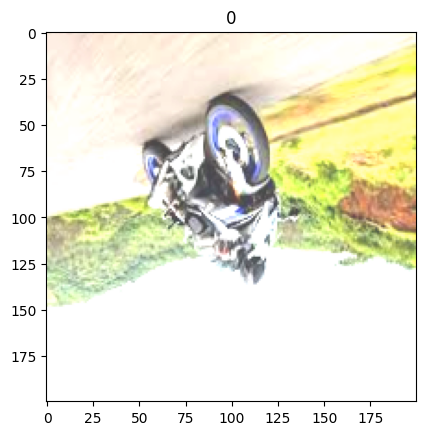

In [5]:
from MLDevHelper.DataLoader import image_loader
from MLDevHelper.Transformer import TransformerList
import matplotlib.pyplot as plt 

transformer_list = TransformerList()

transformer_list.create_transformer_list(
    [
        transformer_list.resize_image((200, 200)),
        transformer_list.color_jitter(
            brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1
        ),
        transformer_list.random_rotate_image(angle=30),
        transformer_list.random_horizontal_flip(threshold=0.5),
        transformer_list.random_vertical_flip(threshold=0.5),
    ]
)


train_loader = image_loader(train_df , 32 , transformer_list , 4 , True , 69)

for batch in train_loader:
    images = batch["images"] 
    labels = batch["labels"]  
    for image , label in zip(images , labels):
        plt.imshow(image)
        plt.title(label)
        plt.show()
        break